# Denoising Noise in Thermal Image

Fixed Pattern Noise (FPN) is characterized by vertical or horizontal striping or checkerboard patterns, particularly arising from the pixel-level non-uniformity and high readout circuit noises in an uncooled LWIR sensor.

Low-Pass/Frequency Noise (LPN) is caused by the interior temperature of a camera housing or camera battery near camera lens with ambient radiation, degrading thermal image quality and affecting downstream computer vision and machine learning tasks such as object detection, segmentation, and feature extraction.

This notebook presents a systematic approach to denoising FPN, LPN and their combined using deep learning and statistical filtering techniques. 

In [ ]:
from __future__ import print_function
import matplotlib.pyplot as plt
%matplotlib inline

import os
#os.environ['CUDA_VISIBLE_DEVICES'] = '1'

import numpy as np
from models.resnet import ResNet
from models.unet import UNet
from models.skip import skip
from models import get_net
import torch
import torch.optim

from skimage.metrics import peak_signal_noise_ratio
from util.common_utils import * 
from util.loss import total_variation


if torch.cuda.is_available():
    torch.backends.cudnn.enabled = True
    torch.backends.cudnn.benchmark =True
    dtype = torch.cuda.FloatTensor
else:
    dtype = torch.FloatTensor

PLOT = True
imsize=-1
dim_div_by = 64

## FPN, LPN, and their combined. 

img_np shape:  (1, 480, 640)


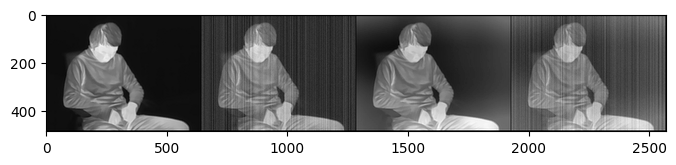

In [5]:
# reading the dataset
base_dir= os.path.join(os.getcwd(), 'data\human')
img_dir1 = os.path.join(base_dir, "images_fpn_f20") # fpn_dir
img_dir2 = os.path.join(base_dir, "images_lpn_l3") # lpn_dir
img_dir3 = os.path.join(base_dir, "images_combined_f20_l3") # combined_dir
img_clean_dir = os.path.join(base_dir, "images_clean") # groud-truth_dir
file_list = os.listdir(img_dir1) # list of shared file names as file index

img_np_list1 = []
img_np_list2 = []
img_np_list3 = []
img_gpu_list1 = []
img_gpu_list2 = []
img_gpu_list3 = []
img_clean_list = []

for f in file_list:
    _, img_np = get_image(os.path.join(img_dir1, f), imsize)
    img_np = img_np[0:1, :, :] 
    img_np_list1.append(img_np)
    img_gpu_list1.append(np_to_torch(img_np).type(dtype))
    _, img_np = get_image(os.path.join(img_dir2, f), imsize)
    img_np = img_np[0:1, :, :] 
    img_np_list2.append(img_np)
    img_gpu_list2.append(np_to_torch(img_np).type(dtype))
    _, img_np = get_image(os.path.join(img_dir3, f), imsize)
    img_np = img_np[0:1, :, :] 
    img_np_list3.append(img_np)
    img_gpu_list3.append(np_to_torch(img_np).type(dtype))

    _, img_clean = get_image(os.path.join(img_clean_dir, f), imsize)
    img_clean = img_clean[0:1, :, :] 
    img_clean_list.append(img_clean)

print("img_np shape: ", img_np_list1[0].shape)

_ = plot_image_grid([img_clean_list[0], img_np_list1[0],img_np_list2[0],img_np_list3[0]], factor=4, nrow=4)

From left to right, the images represent the ground truth, FPN-added, LFN-added, and the combination of both noise types.

The combination is a model of Spatial Pattern Noise (SPN) that generally arises due to sensor imperfections, optical distortions, or electronic interference in imaging systems. 

### Model Evaluation Metrics

**Peak Signal-to-Noise Ratio (PSNR)** is a commonly used metric to evaluate the quality of **reconstructed or denoised images** by comparing them to a reference image. It is expressed in **decibels (dB)** and measures the ratio between the maximum possible signal power and the power of corrupting noise.  The **PSNR** is defined as:  

$ PSNR = 10 \cdot \log_{10} \left(\frac{MAX_I^2}{MSE} \right) $

where:  
- $MAX_I$ is the maximum possible pixel value of the image (e.g., 255 for an 8-bit image).  
- $MSE$ is the **Mean Squared Error** between the reference (ground truth) image and the processed image, given by:  

$ MSE = \frac{1}{mn} \sum_{i=0}^{m-1} \sum_{j=0}^{n-1} \left[ I(i,j) - K(i,j) \right]^2 $

where:  
- $I(i,j)$ is the **ground truth image**.  
- $K(i,j)$ is the **denoised/reconstructed image**.  
- $m$ and $n$ are the dimensions of the image.  

#### **Interpretation**  
- **Higher PSNR** → Better image quality (less distortion and noise).  
- **Lower PSNR** → Poorer image quality (more noise and artifacts).  
- Typically, a **PSNR above 30 dB** is considered good for **image processing applications**.

#### **Limitations**  
⚠️ **PSNR does not always correlate with perceptual image quality**, as it only measures pixel-wise differences and ignores structural distortions. Metrics like **SSIM (Structural Similarity Index)** are often used alongside PSNR for a more accurate assessment.  

## 2. General Model Setup

In [6]:
# total number of iteration
num_iter = 5000
# model evaluation per iteration
show_every=500 

figsize=5
# model hyper-parameters
pad = 'reflection' # 'zero'
INPUT = 'noise'
input_depth = 32  # number of input channels of noise (to reconstruct the image and to denoise with early stopping)
OPTIMIZER = 'adam'
OPT_OVER =  'net'
LR = 1e-4
reg_noise_std = 3e-5

# encoder-decoder CNN with skip connections
NET_TYPE = 'skip'
net = get_net(input_depth, 'skip', pad, n_channels=1,
                skip_n33d=128, 
                skip_n33u=128, 
                skip_n11=4, 
                num_scales=5,
                upsample_mode='bilinear').type(dtype)

# mse Loss
mse = torch.nn.MSELoss().type(dtype)

# img_np.shape= (1,480.640)
net_input = get_noise(input_depth, INPUT, img_np.shape[1:]).type(dtype).detach()  #(input_depth=32, 480, 640)

num_parametes = sum(p.numel() for p in net.parameters() if p.requires_grad)
print("total number parameters: {}".format(num_parametes))

total number parameters: 2217573


In [ ]:
# other available dataset
# base_dir= os.path.join(os.getcwd(), 'data\power_supply')
# img_dir = os.path.join(base_dir, "images_fpn_f05")

# file_list = os.listdir(img_dir)
# file_list = sorted(file_list, key= lambda x: int(x.split(".")[0]))

# img_np_list = []
# img_gpu_list = []
# img_clean_list = []

# for f in file_list:
#     _, img_np = get_image(os.path.join(img_dir, f), imsize)
#     img_np = img_np[0:1, :, :] 
#     img_np_list.append(img_np)
#     img_gpu_list.append(np_to_torch(img_np).type(dtype))

# print("img_np shape: ", img_np_list[0].shape)

# _ = plot_image_grid([img_np_list[0], img_np_list[-1]], factor=4, nrow=2)

## 3.Task 1: Denosing FPN (using list #1)

### Model Train with a predefined epochs

Starting optimization with ADAM


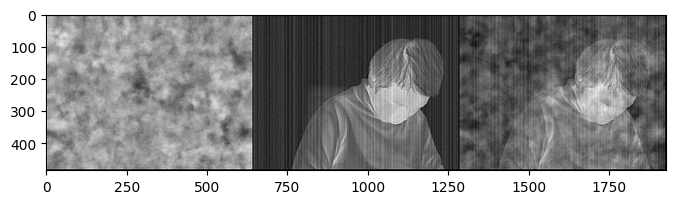

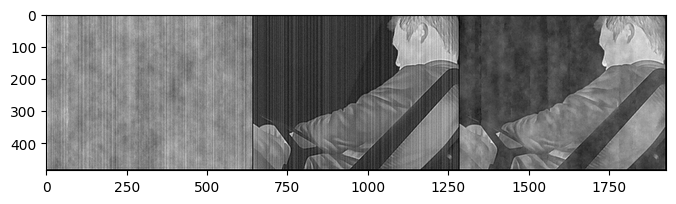

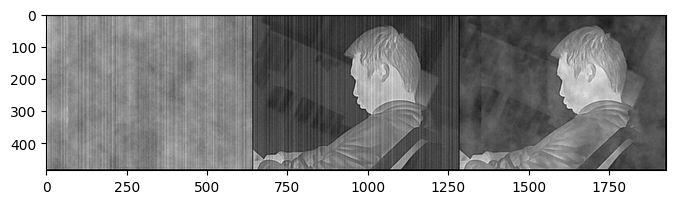

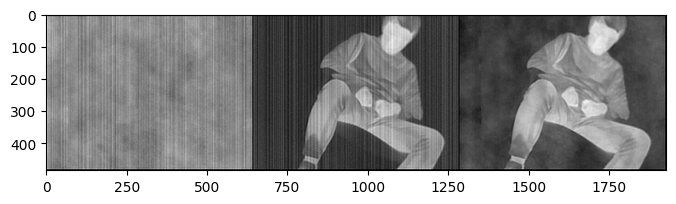

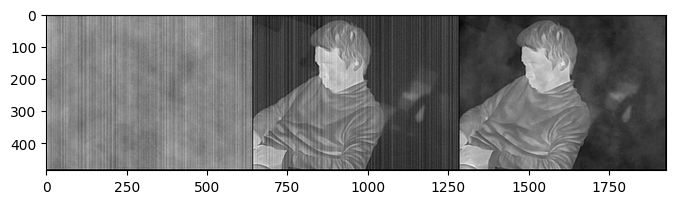

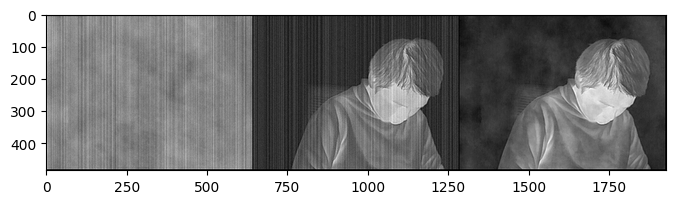

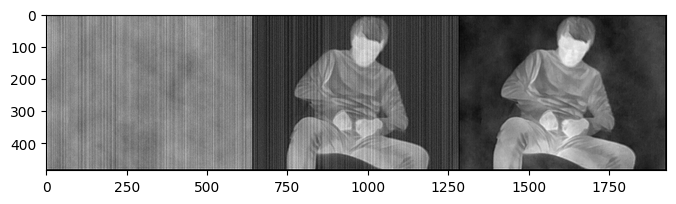

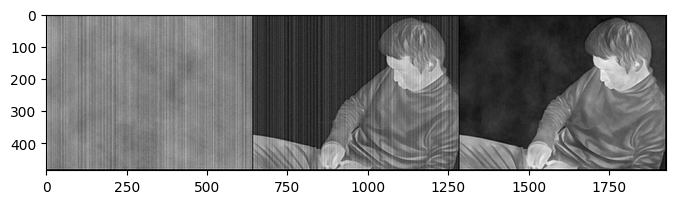

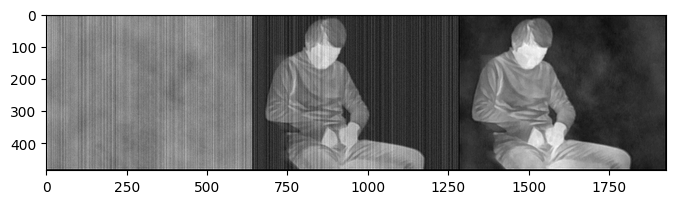

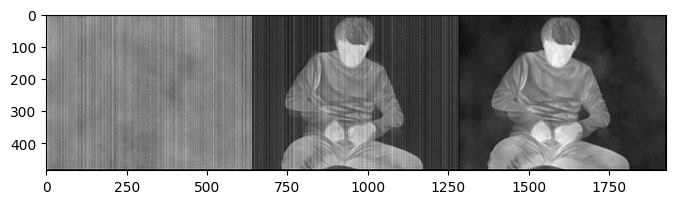

In [64]:
img_zero = torch.zeros_like(img_gpu_list1[0])

def closure():

    global i, last_net, net_input
    
    if reg_noise_std > 0:
        net_input = net_input_saved + (noise.normal_() * reg_noise_std)
    
    # denoised image
    out = net(net_input)

    index = np.random.randint(0, len(img_gpu_list1))

    # if i < 2000:
    #     total_loss = mse(out, img_gpu_list[index]) # + 1e-6 * total_variation(img_gpu_list[index] - out)
    # else:
    #     total_loss = 1e-2 * total_variation(img_gpu_list[index] - out)
    total_loss = 1e-2 * total_variation(img_gpu_list1[index] - out)
    total_loss.backward()
    
    learned_noise = out.detach().cpu().numpy()[0]
    out_clean = img_np_list1[index] - out.detach().cpu().numpy()[0]
    out_clean_norm = (out_clean-np.min(out_clean))/(np.max(out_clean)-np.min(out_clean))
    psrn = peak_signal_noise_ratio(img_clean_list[index], out_clean_norm) 

    print ('Iteration %05d    Loss %f PSNR %f' % (i, total_loss.item(), psrn),'\r', end='')
    
    if  PLOT and i % show_every == 0:
        plot_image_grid([np.clip(learned_noise, 0, 1), img_np_list1[index], out_clean_norm], factor=figsize, nrow=3)

    i += 1

    return total_loss

# Init globals 
last_net = None
i = 0

net_input_saved = net_input.detach().clone()
noise = net_input.detach().clone()

# Run
p = get_params(OPT_OVER, net, net_input)
optimize(OPTIMIZER, p, closure, LR=LR, num_iter=num_iter)

### Model Evaluation

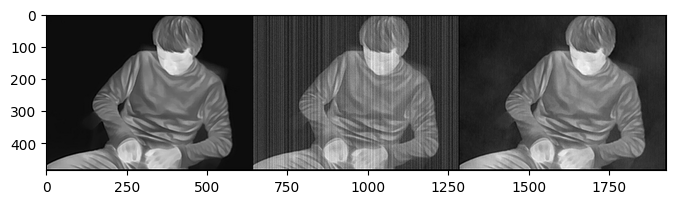

In [ ]:
_ = plot_image_grid([img_clean_list[index], img_np_list1[index], out_clean_norm], factor=figsize, nrow=3)

### Show all the input noisy images.

(1, 480, 640)


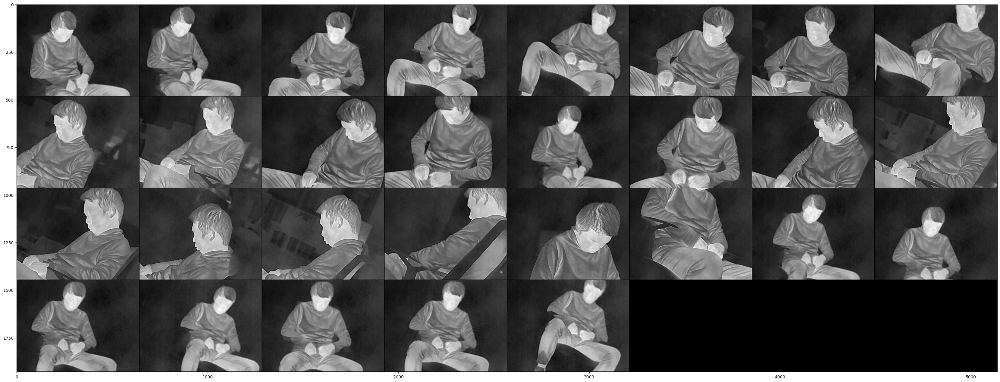

In [ ]:
out_np = torch_to_np(net(net_input)) # (1,480,640)
out_list = []

for index, img_np in enumerate(img_np_list1[:30]):
    out_clean = img_np - out_np[0]
    out_clean_norm = (out_clean-np.min(out_clean))/(np.max(out_clean)-np.min(out_clean))
    out_list.append(out_clean_norm)


q = plot_image_grid(out_list, factor=13)

In [65]:
index = file_list.index("17.jpg")
out_clean = img_np_list1[index] - out_np[0]
out_clean_norm = (out_clean-np.min(out_clean))/(np.max(out_clean)-np.min(out_clean))
image = out_clean_norm[0] * 255
image = np.array(image, dtype=np.uint8)

cv2.imwrite("out_tv_dip.png", image)

psnr1 = peak_signal_noise_ratio(img_clean_list[index], img_np_list1[index]) 
psnr2 = peak_signal_noise_ratio(img_clean_list[index], out_clean_norm) 

print("PSNR of the truth and noisy image is {}.".format(psnr1))

print("After denosing, PSNR is {}.".format(psnr2))


PSNR of the truth and noisy image is 19.003804043636926.
After denosing, PSNR is 24.055715880700728.


## 4.Task 2: Denosing LPN (using list #2)

Codes below demonstrate how a LPN can be generated.

img_np shape:  (1, 480, 640)


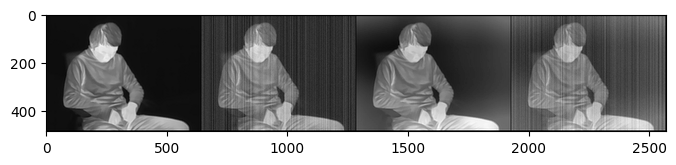

In [7]:

# reading the dataset
base_dir= os.path.join(os.getcwd(), 'data\human')
img_dir1 = os.path.join(base_dir, "images_fpn_f20") # fpn_dir
img_dir2 = os.path.join(base_dir, "images_lpn_l3") # lpn_dir
img_dir3 = os.path.join(base_dir, "images_combined_f20_l3") # combined_dir
img_clean_dir = os.path.join(base_dir, "images_clean") # groud-truth_dir
file_list = os.listdir(img_dir1) # list of shared file names as file index

img_np_list1 = []
img_np_list2 = []
img_np_list3 = []
img_gpu_list1 = []
img_gpu_list2 = []
img_gpu_list3 = []
img_clean_list = []

for f in file_list:
    _, img_np = get_image(os.path.join(img_dir1, f), imsize)
    img_np = img_np[0:1, :, :] 
    img_np_list1.append(img_np)
    img_gpu_list1.append(np_to_torch(img_np).type(dtype))
    _, img_np = get_image(os.path.join(img_dir2, f), imsize)
    img_np = img_np[0:1, :, :] 
    img_np_list2.append(img_np)
    img_gpu_list2.append(np_to_torch(img_np).type(dtype))
    _, img_np = get_image(os.path.join(img_dir3, f), imsize)
    img_np = img_np[0:1, :, :] 
    img_np_list3.append(img_np)
    img_gpu_list3.append(np_to_torch(img_np).type(dtype))

    _, img_clean = get_image(os.path.join(img_clean_dir, f), imsize)
    img_clean = img_clean[0:1, :, :] 
    img_clean_list.append(img_clean)

print("img_np shape: ", img_np_list1[0].shape)

_ = plot_image_grid([img_clean_list[0], img_np_list1[0],img_np_list2[0],img_np_list3[0]], factor=4, nrow=4)

# low-pass filter
import cv2

def high_pass_blur(img_np, gauss_ksize):
    img_np_cv = np.copy(img_np)
    img_np_cv = np.moveaxis(img_np_cv, 0, 2)
    img_lp = cv2.blur(img_np_cv, (gauss_ksize, gauss_ksize))
    img_hp = img_np_cv - np.expand_dims(img_lp, 2)
    img_hp = np.moveaxis(img_hp, 2, 0)
    return img_hp

def high_pass_nlm(img_np):
    img_np_cv = np.array(img_np[0, :, :], dtype=np.uint8)
    img_lp = cv2.fastNlMeansDenoising(img_np_cv, 1, 3, 7)
    img_hp = np.array(np.expand_dims(img_lp, 0), dtype=np.float32)
    img_hp = img_np - img_hp
    return img_hp


def blur(img_np, gauss_ksize):
    img_np_cv = np.copy(img_np)
    img_np_cv = np.moveaxis(img_np_cv, 0, 2)
    img_lp = cv2.blur(img_np_cv, (gauss_ksize, gauss_ksize))
    img_lp = np.expand_dims(img_lp, 0)
    return img_lp


### Model setup and train

number parameters: 2217573
Starting optimization with ADAM


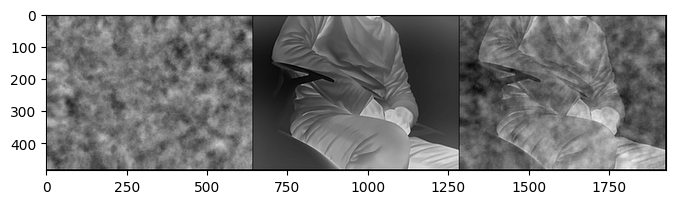

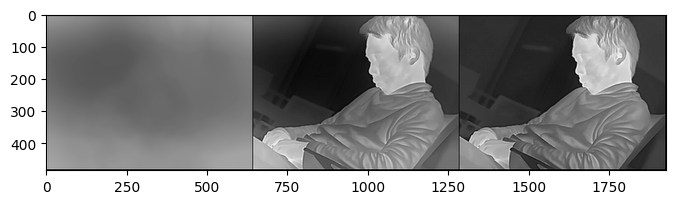

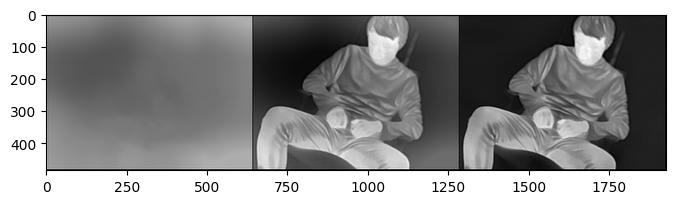

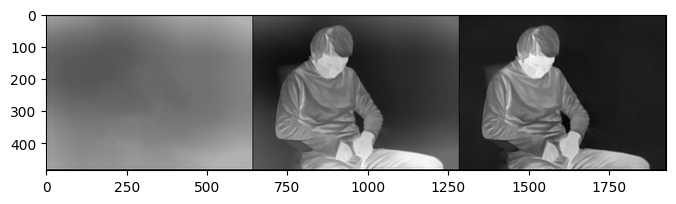

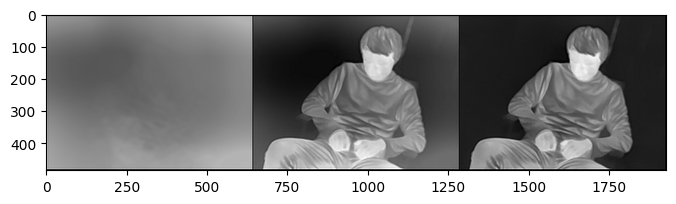

...

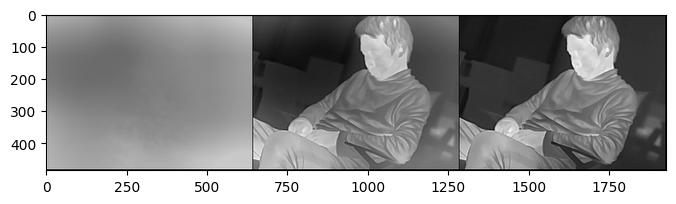

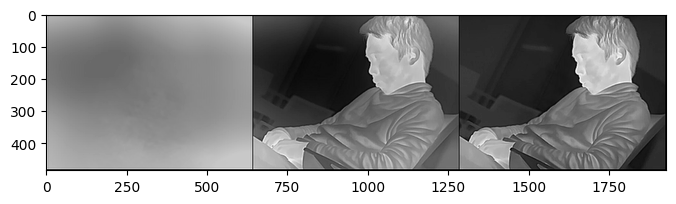

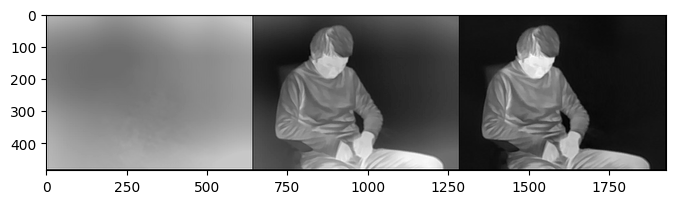

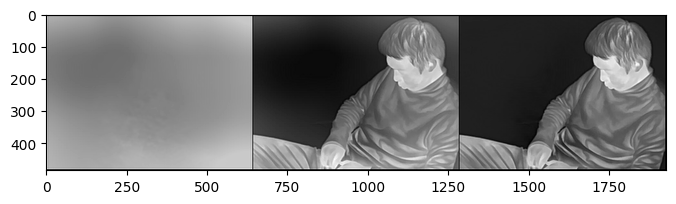

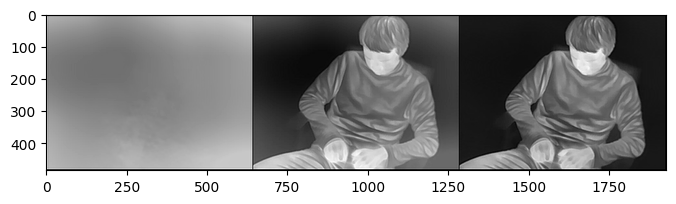

In [8]:
show_every=200
figsize=5
pad = 'reflection' # 'zero'
INPUT = 'noise'
input_depth = 32
OPTIMIZER = 'adam'
OPT_OVER =  'net'

OPTIMIZER = 'adam'

LR = 5e-4
num_iter = 8000 # 6000 for human
reg_noise_std = 3e-5

NET_TYPE = 'skip'
net = get_net(input_depth, 'skip', pad, n_channels=1,
                skip_n33d=128, 
                skip_n33u=128, 
                skip_n11=4, 
                num_scales=5,
                upsample_mode='bilinear').type(dtype)

# Loss
mse = torch.nn.MSELoss().type(dtype)
#img_var = np_to_torch(img_np).type(dtype)

net_input = get_noise(input_depth, INPUT, img_np.shape[1:]).type(dtype).detach()

num_parametes = sum(p.numel() for p in net.parameters() if p.requires_grad)
print("number parameters: {}".format(num_parametes))

img_zero = torch.zeros_like(img_gpu_list2[0])

def closure():

    global i, last_net, net_input
    
    if reg_noise_std > 0:
        net_input = net_input_saved + (noise.normal_() * reg_noise_std)
    
    out = net(net_input)

    index = np.random.randint(0, len(img_gpu_list2))

    target = img_np_list2[index]
    target_gpu = img_gpu_list2[index]
    
    # available loss implmentation
    # method 1:
    # total_loss = total_variation(target_gpu - out, step=1)

    # method 2:
    # tv_step = np.random.randint(10, 30)
    # total_loss = total_variation(target_gpu - out, step=tv_step)

    # method 3:
    # tv_step = np.random.randint(10, 30)
    # total_loss = total_variation(target_gpu - out, step=tv_step) + mse(img_zero, out)

    # method 4:
    # iter_step = 3000
    # if i <= iter_step * 1:
    #     tv_step = np.random.randint(20, 30)
    # else:
    #     tv_step = np.random.randint(10, 20)
    # total_loss = total_variation(target_gpu - out, step=tv_step)

    # method 5:
    # iter_step = 3000
    # if i <= iter_step * 1:
    #     tv_step = np.random.randint(20, 30)
    # else:
    #     tv_step = np.random.randint(10, 20)
    # total_loss = total_variation(target_gpu - out, step=tv_step) + mse(img_zero, out)

    # method 6:
    # tv_step = np.random.randint(10, 30)
    # tv_step1 = np.random.randint(1, 4)
    # total_loss = total_variation(target_gpu - out, step=tv_step) + total_variation(target_gpu - out, step=tv_step1)

    # method 7:
    # iter_step = 3000
    # if i <= iter_step * 1:
    #     tv_step = np.random.randint(20, 30)
    # else:
    #     tv_step = np.random.randint(10, 20)
    # tv_step1 = np.random.randint(1, 4)
    # total_loss = total_variation(target_gpu - out, step=tv_step) + total_variation(target_gpu - out, step=tv_step1)

    # method 8:
    iter_step = 3000
    if i <= iter_step * 1:
        tv_step = np.random.randint(20, 30)
    else:
        tv_step = np.random.randint(10, 20)
    tv_step1 = np.random.randint(1, 4)
    total_loss = total_variation(target_gpu - out, step=tv_step) +  \
                 total_variation(target_gpu - out, step=tv_step1) + \
                 mse(img_zero, out)


    total_loss.backward()
    
    learned_noise = out.detach().cpu().numpy()[0]
    out_clean = img_np_list2[index] - out.detach().cpu().numpy()[0]
    out_clean_norm = (out_clean-np.min(out_clean))/(np.max(out_clean)-np.min(out_clean))
    psrn = peak_signal_noise_ratio(img_clean_list[index], out_clean_norm) 

    print ('Iteration %05d    Loss %f PSNR %f' % (i, total_loss.item(), psrn),'\r', end='')
    
    
    if  PLOT and i % show_every == 0:
        plot_image_grid([np.clip(learned_noise, 0, 1), target, out_clean_norm], factor=figsize, nrow=3)

    i += 1

    return total_loss

# Init globals 
last_net = None
i = 0

net_input_saved = net_input.detach().clone()
noise = net_input.detach().clone()

# Run
p = get_params(OPT_OVER, net, net_input)
optimize(OPTIMIZER, p, closure, LR=LR, num_iter=num_iter)

Compared to FPN, DIP+TV are extremely good at denosing LPN (>30db PSNR) 

### Model Evaluation

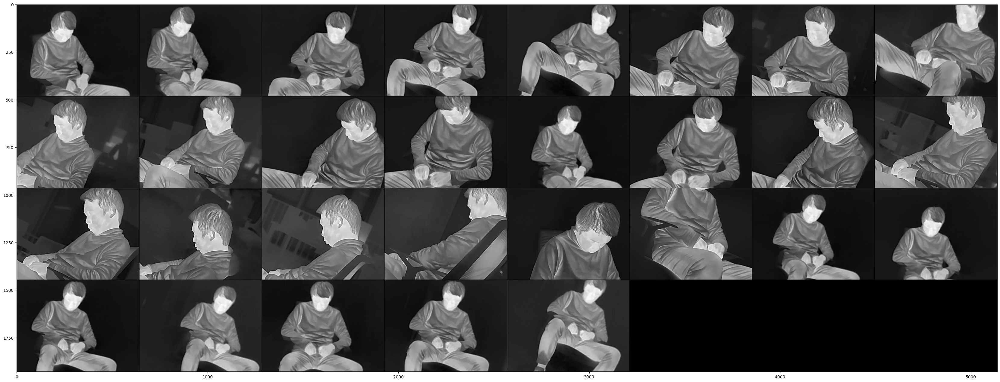

PSNR of the truth and noisy image is 18.50053477629571.
After denosing, PSNR is 30.84852415656257.


In [11]:
out_np = torch_to_np(net(net_input)) # (1,480,640)
out_list = []

for index, img_np in enumerate(img_np_list2[:30]):
    out_clean = img_np - out_np[0]
    out_clean_norm = (out_clean-np.min(out_clean))/(np.max(out_clean)-np.min(out_clean))
    out_list.append(out_clean_norm)


q = plot_image_grid(out_list, factor=13)
index = file_list.index("17.jpg")
out_clean = img_np_list2[index] - out_np[0]
out_clean_norm = (out_clean-np.min(out_clean))/(np.max(out_clean)-np.min(out_clean))
image = out_clean_norm[0] * 255
image = np.array(image, dtype=np.uint8)

cv2.imwrite("out_tv_dip.png", image)

psnr1 = peak_signal_noise_ratio(img_clean_list[index], img_np_list2[index]) 
psnr2 = peak_signal_noise_ratio(img_clean_list[index], out_clean_norm) 

print("PSNR of the truth and noisy image is {}.".format(psnr1))

print("After denosing, PSNR is {}.".format(psnr2))

## 5.Task 3: Denosing FPN+LPN (using list #3)

In [ ]:
def closure():

    global i, last_net, net_input
    
    if reg_noise_std > 0:
        net_input = net_input_saved + (noise.normal_() * reg_noise_std)
    
    out = net(net_input)

    index = np.random.randint(0, len(img_gpu_list3))

    target = img_np_list3[index]
    target_gpu = img_gpu_list3[index]

    
    if i <= iter_step * 1:
        tv_step = np.random.randint(50, 60)
    elif i <= iter_step * 2:
        tv_step = np.random.randint(40, 50)
    elif i <= iter_step * 3:
        tv_step = np.random.randint(30, 40)
    elif i <= iter_step * 4:
        tv_step = np.random.randint(20, 30)
    elif i <= iter_step * 5:
        tv_step = np.random.randint(10, 20)
    else:
        tv_step = np.random.randint(3, 10)

    tv_step1 = np.random.randint(1, 4)
    total_loss = total_variation(img_gpu_list3[index] - out, reduction="sum", step=tv_step) + \
                 total_variation(img_gpu_list3[index] - out, reduction="sum", step=tv_step1)


    total_loss.backward()
    
    learned_noise = out.detach().cpu().numpy()[0]
    out_clean = img_np_list3[index] - out.detach().cpu().numpy()[0]
    out_clean_norm = (out_clean-np.min(out_clean))/(np.max(out_clean)-np.min(out_clean))
    psrn = peak_signal_noise_ratio(img_clean_list[index], out_clean_norm) 

    print ('Iteration %05d    Loss %f PSNR %f' % (i, total_loss.item(), psrn),'\r', end='')
    
    
    if  PLOT and i % show_every == 0:
        plot_image_grid([np.clip(learned_noise, 0, 1), target, out_clean_norm], factor=figsize, nrow=3)

    i += 1

    return total_loss

# Init globals 
last_net = None
i = 0


net_input_saved = net_input.detach().clone()
noise = net_input.detach().clone()

# Run
p = get_params(OPT_OVER, net, net_input)
optimize(OPTIMIZER, p, closure, LR=LR, num_iter=num_iter)

In [ ]:
def closure():

    global i, last_net, net_input, index, num_iter
    
    if reg_noise_std > 0:
        net_input = net_input_saved + (noise.normal_() * reg_noise_std)
    
    out = net(net_input)

    target = img_np_list3[index]
    target_gpu = img_gpu_list3[index]
    
    tv_step = np.random.randint(3, 10)
    total_loss = total_variation(img_gpu_list3[index] - out, reduction="sum", step=1) + \
                 1e-1 * total_variation(img_gpu_list3[index] - out, reduction="sum", step=tv_step)
         #+ 1e-1 * mse(fpn_target, out)

    total_loss.backward()
    
    learned_noise = out.detach().cpu().numpy()[0]
    out_clean = img_np_list3[index] - out.detach().cpu().numpy()[0]
    out_clean_norm = (out_clean-np.min(out_clean))/(np.max(out_clean)-np.min(out_clean))
    psrn = peak_signal_noise_ratio(img_clean_list[index], out_clean_norm) 

    print ('Iteration %05d    Loss %f PSNR %f' % (i, total_loss.item(), psrn),'\r', end='')
    
    i += 1
    return total_loss


out_list = []
max_psnr = -1
max_index = -1

for index, img_np in enumerate(img_np_list):
    last_net = None
    i = 0
    num_iter = 50
    LR = 1e-4

    # Run
    p = get_params(OPT_OVER, net, net_input)
    optimize(OPTIMIZER, p, closure, LR=LR, num_iter=num_iter)

    out_np = torch_to_np(net(net_input))
    out_clean = img_np - out_np[0]
    out_clean_norm = (out_clean-np.min(out_clean))/(np.max(out_clean)-np.min(out_clean))
    out_list.append(out_clean_norm)

    psnr = peak_signal_noise_ratio(img_clean_list[index], out_clean_norm)
    if psnr > max_psnr:
        max_psnr = psnr
        max_index = index

